# Sample session for using Calcimp.jl

In [1]:
include("../src/calcimp.jl")

Main.Calcimp

In [2]:
using .Calcimp

Read default calculation parameter.

In [3]:
prm = getcalcparams()

Dict{String,Any} with 5 entries:
  "maxfreq"     => 2000.0
  "stepfreq"    => 2.5
  "minfreq"     => 0.0
  "temperature" => 24.0
  "radiation"   => "PIPE"

We can change paremeter values.

In [4]:
prm["stepfreq"] = 1.0

1.0

Changes are reflected to the global parameters.

In [5]:
getcalcparams()

Dict{String,Any} with 5 entries:
  "maxfreq"     => 2000.0
  "stepfreq"    => 1.0
  "minfreq"     => 0.0
  "temperature" => 24.0
  "radiation"   => "PIPE"

Calling hidden updatecalcparams! function shows internal calculation parameters such as $c_0, \rho$ etc.

In [7]:
Calcimp.updatecalcparams!(prm);

In [8]:
getcalcparams()

Dict{String,Any} with 11 entries:
  "dmp"         => 1.4714
  "nu"          => 1.52753e-5
  "mu"          => 1.81544e-5
  "temperature" => 24.0
  "stepfreq"    => 1.0
  "minfreq"     => 0.0
  "rhoc0"       => 410.862
  "maxfreq"     => 2000.0
  "rho"         => 1.18848
  "c0"          => 345.704
  "radiation"   => "PIPE"

Calling calcimp with params to use custom calculation parameters.

In [9]:
prm

Dict{String,Any} with 11 entries:
  "dmp"         => 1.4714
  "nu"          => 1.52753e-5
  "mu"          => 1.81544e-5
  "temperature" => 24.0
  "stepfreq"    => 1.0
  "minfreq"     => 0.0
  "rhoc0"       => 410.862
  "maxfreq"     => 2000.0
  "rho"         => 1.18848
  "c0"          => 345.704
  "radiation"   => "PIPE"

In [10]:
imp = calcimp("../sample/simple.xmen", prm)

,frq,imp
1,0.0,0.0+0.0im
2,1.0,1.85358+9.78963im
3,2.0,2.80872+18.3108im
4,3.0,3.56182+26.6057im
5,4.0,4.20959+34.7967im
6,5.0,4.79165+42.9347im
7,6.0,5.32916+51.0487im
8,7.0,5.83519+59.1583im
9,8.0,6.31855+67.2782im
10,9.0,6.78566+75.4209im


In [18]:
using DataFrames

In [11]:
using DataFramesMeta

┌ Info: Precompiling DataFramesMeta [1313f7d8-7da2-5740-9ea0-a2ca25f37964]
└ @ Base loading.jl:1189


In [21]:
imp2 = @transform(imp, mag = 20log10.(abs.(:imp)));

In [15]:
using Plots
pyplot()

Plots.PyPlotBackend()

In [16]:
using StatPlots

┌ Info: Precompiling StatPlots [60ddc479-9b66-56df-82fc-76a74619b69c]
└ @ Base loading.jl:1189


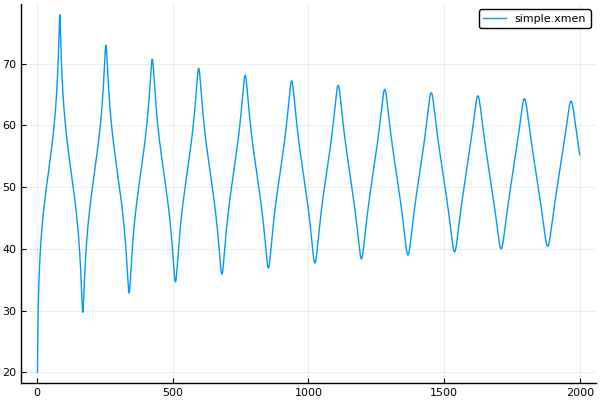

In [22]:
@df imp2 plot(:frq, :mag, label="simple.xmen")

In [26]:
@time calcimp("../sample/simple.xmen", prm)

  0.517566 seconds (5.26 M allocations: 90.339 MiB, 12.86% gc time)


,frq,imp
1,0.0,0.0+0.0im
2,1.0,1.85358+9.78963im
3,2.0,2.80872+18.3108im
4,3.0,3.56182+26.6057im
5,4.0,4.20959+34.7967im
6,5.0,4.79165+42.9347im
7,6.0,5.32916+51.0487im
8,7.0,5.83519+59.1583im
9,8.0,6.31855+67.2782im
10,9.0,6.78566+75.4209im


In [27]:
@time calcimp("../sample/split.xmen", prm)

  1.190284 seconds (10.86 M allocations: 188.508 MiB, 9.93% gc time)


,frq,imp
1,0.0,0.0+0.0im
2,1.0,0.294884+1.57344im
3,2.0,0.446485+2.94073im
4,3.0,0.565178+4.26979im
5,4.0,0.666192+5.58007im
6,5.0,0.755699+6.87754im
7,6.0,0.836947+8.16641im
8,7.0,0.911893+9.44861im
9,8.0,0.981832+10.7257im
10,9.0,1.04767+11.9985im


In [30]:
prm["stepfreq"] = 2.5

2.5

In [32]:
@time imp3 = calcimp("../practice/10_time-cmp/taper.xmen", prm)

 22.634910 seconds (60.95 M allocations: 1.740 GiB, 7.43% gc time)


,frq,imp
1,0.0,0.0+0.0im
2,2.5,0.744428+7.08113im
3,5.0,1.09453+13.6905im
4,7.5,1.36822+20.2368im
5,10.0,1.60393+26.7699im
6,12.5,1.81714+33.3151im
7,15.0,2.0161+39.8903im
8,17.5,2.20599+46.5106im
9,20.0,2.39042+53.1898im
10,22.5,2.57215+59.9414im


In [34]:
imp3 = @transform(imp3, mag = 20log10.(abs.(:imp)));

In [35]:
head(imp3)

,frq,imp,mag
1,0.0,0.0+0.0im,-Inf
2,2.5,0.744428+7.08113im,17.0498
3,5.0,1.09453+13.6905im,22.7561
4,7.5,1.36822+20.2368im,26.1426
5,10.0,1.60393+26.7699im,28.5685
6,12.5,1.81714+33.3151im,30.4657


In [36]:
tail(imp3)

,frq,imp,mag
1,1987.5,491.911-758.57im,59.1244
2,1990.0,415.962-699.165im,58.2076
3,1992.5,356.365-642.884im,57.3263
4,1995.0,309.068-590.502im,56.4759
5,1997.5,271.105-542.138im,55.6515
6,2000.0,240.303-497.603im,54.848


In [37]:
using Profile

In [38]:
@profile calcimp("../practice/10_time-cmp/taper.xmen")

,frq,imp
1,0.0,0.0+0.0im
2,2.5,0.744428+7.08113im
3,5.0,1.09453+13.6905im
4,7.5,1.36822+20.2368im
5,10.0,1.60393+26.7699im
6,12.5,1.81714+33.3151im
7,15.0,2.0161+39.8903im
8,17.5,2.20599+46.5106im
9,20.0,2.39042+53.1898im
10,22.5,2.57215+59.9414im


In [39]:
Profile.print()

┌ Warning: The profile data buffer is full; profiling probably terminated
│ before your program finished. To profile for longer runs, call
│ `Profile.init()` with a larger buffer and/or larger delay.
└ @ Profile /buildworker/worker/package_linux64/build/usr/share/julia/stdlib/v1.0/Profile/src/Profile.jl:312


3     ./array.jl:287; fill!(::Array{Complex,2}, ::Compl...
1     ./array.jl:130; vect(::Float64, ::Vararg{Float64,...
2     ./complex.jl:362; /(::Complex{Float64}, ::Complex{F...
2     ./complex.jl:423; ssqs(::Float64, ::Float64)
1     ./dict.jl:155; grow_to!(::Dict{Symbol,Any}, ::Tu...
2     ./dict.jl:157; grow_to!(::Dict{Symbol,String}, :...
 1 ./dict.jl:90; Dict{Symbol,Any}()
1     ./dict.jl:160; grow_to!(::Dict{Symbol,Complex{In...
15    ./dict.jl:280; ht_keyindex(::Dict{Symbol,Any}, :...
2     ./dict.jl:290; ht_keyindex(::Dict{String,Any}, :...
14    ./dict.jl:291; ht_keyindex(::Dict{String,Any}, :...
1     ./dict.jl:305; ht_keyindex2!(::Dict{Symbol,Any},...
2     ./dict.jl:316; ht_keyindex2!(::Dict{Symbol,Any},...
4     ./dict.jl:381; setindex!(::Dict{Symbol,Any}, ::A...
3     ./dict.jl:392; setindex!(::Dict{Symbol,Any}, ::C...
1     ./essentials.jl:355; cconvert(::Type, ::Int64)
 1 ...-1.0.1/lib/julia/sys.so:?; convert(::Type{Int32}, ::Int64)
1     ./iobuffer.jl:369; take!(::Bas

              39 ./dict.jl:129; Dict(::Tuple{Pair{Symbol,Co...
               38 ./abstractdict.jl:544; dict_with_eltype
                4  ./abstractdict.jl:543; dict_with_eltype
                 4 ./dict.jl:91; Dict{Any,Any}()
                  4 ./boot.jl:394; Type
                1  ./dict.jl:143; grow_to!
                 1 ./dict.jl:167; empty
                  1 ./dict.jl:91; Dict{Symbol,Complex{Int64...
                   1 ./boot.jl:394; Type
                33 ./dict.jl:145; grow_to!
                 2  ./dict.jl:153; grow_to!(::Dict{Symbol,Co...
                  2 ./pair.jl:50; indexed_iterate
                   1 ./pair.jl:50; indexed_iterate
                 25 ./dict.jl:157; grow_to!(::Dict{Symbol,Co...
                  2  ./dict.jl:167; empty(::Dict{Symbol,Comp...
                   2 ./dict.jl:91; Dict{Symbol,Any}()
                    2 ./boot.jl:394; Type
                  22 ./promotion.jl:128; promote_typejoin(::Any, ...
                   14 ./promotion.jl:129; _

                         3 ...c/integral.jl:15; (::getfield(Struve, S...
                          2 ./math.jl:780; ^
                          1 ...ecial/exp.jl:98; exp(::Float64)
                       1  ...src/QuadGK.jl:60; evalrule(::getfield(Q...
                        1 ...src/QuadGK.jl:112; (::getfield(QuadGK, S...
                         1 ...c/integral.jl:15; (::getfield(Struve, S...
                          1 ./math.jl:780; ^
                       1  ...src/QuadGK.jl:61; evalrule(::getfield(Q...
                        1 ./float.jl:399; *(::Float64, ::Float64)
                       10 ...src/QuadGK.jl:64; evalrule(::getfield(Q...
                        5 ...src/QuadGK.jl:112; (::getfield(QuadGK, S...
                         1 ./operators.jl:502; *
                         3 ...c/integral.jl:15; (::getfield(Struve, S...
                          3 ./math.jl:780; ^
                       6  ...src/QuadGK.jl:65; evalrule(::getfield(Q...
                        6 ...src/Q

                          14 ./math.jl:780; ^
                          2  ...ecial/exp.jl:109; exp(::Float64)
                           2 ./float.jl:302; unsafe_trunc
                          3  ...ecial/exp.jl:116; exp(::Float64)
                           3 ...ecial/exp.jl:52; exp_kernel
                            3 ./float.jl:404; muladd
                          4  ...ecial/exp.jl:117; exp(::Float64)
                           2 ./float.jl:397; -
                           2 ./float.jl:401; /
                       35 ...src/QuadGK.jl:65; evalrule(::getfield(Qu...
                        1  ./promotion.jl:313; +
                         1 ./float.jl:395; +
                        1  ...src/QuadGK.jl:111; (::getfield(QuadGK, S...
                         1 ./promotion.jl:316; /
                          1 ./float.jl:401; /
                        31 ...src/QuadGK.jl:112; (::getfield(QuadGK, S...
                         1  ./float.jl:399; *
                         9  ./operator

                     2 ./int.jl:448; >>
                      2 ./int.jl:442; >>
                    1 ./hashing.jl:35; hash_64_64
                     1 ./int.jl:53; +
                   4 ./reflection.jl:258; objectid
                 1  ./int.jl:52; -
               74  ./dict.jl:287; ht_keyindex(::Dict{Symbol...
                74 ./array.jl:731; isslotempty
               30  ./dict.jl:290; ht_keyindex(::Dict{Symbol...
                27 ./array.jl:731; getindex
                3  ./dict.jl:173; isslotmissing
                 3 ./promotion.jl:425; ==
              41  ./dict.jl:478; getindex
               39 ./array.jl:731; getindex
              7   ./operators.jl:286; >(::Float64, ::Float64)
               7 ./float.jl:452; <
              2   ./sysimg.jl:18; getproperty
             31232 ...jl/src/mensur.jl:542; calc_impedance!(::Float64...
              3    ./array.jl:0; calc_transmission(::Float...
              161  ./array.jl:467; calc_transmission(::Float...
           

                    7 ...rings/string.jl:83; sizeof
                  2  ./int.jl:297; &
                1  ./dict.jl:284; ht_keyindex(::Dict{String...
                 1 ./sysimg.jl:18; getproperty
                2  ./dict.jl:287; ht_keyindex(::Dict{String...
                 2 ./dict.jl:171; isslotempty
                  2 ./array.jl:731; getindex
                16 ./dict.jl:290; ht_keyindex(::Dict{String...
                 2 ./array.jl:731; getindex
                1  ./dict.jl:291; ht_keyindex(::Dict{String...
               1  ./dict.jl:478; getindex
                1 ./int.jl:49; <
              70   ...jl/src/mensur.jl:398; calc_transmission(::Float...
               64 ./dict.jl:477; getindex
                4  ./dict.jl:280; ht_keyindex(::Dict{String...
                 1 ./sysimg.jl:18; getproperty
                33 ./dict.jl:283; ht_keyindex(::Dict{String...
                 33 ./dict.jl:169; hashindex
                  33 ./hashing.jl:18; hash
                   33 ./ha

                3  ./float.jl:399; *
                2  ...al/hyperbolic.jl:0; cosh(::Float64)
                2  ...al/hyperbolic.jl:107; cosh(::Float64)
                 1 ./float.jl:526; isnan
                  1 ./float.jl:450; !=
                78 ...al/hyperbolic.jl:112; cosh(::Float64)
                 3  ./promotion.jl:316; /
                  3 ./float.jl:401; /
                 75 ./special/log.jl:279; log
                  6  ./float.jl:395; log_proc1
                  41 ./special/log.jl:156; log_proc1
                   39 ./array.jl:731; getindex(::Array{Tuple{F...
                  28 ./special/log.jl:157; log_proc1
                   28 ./float.jl:395; +
                1  ...al/hyperbolic.jl:114; cosh(::Float64)
                81 ...al/hyperbolic.jl:117; cosh(::Float64)
                 81 ./math.jl:285; expm1
                17 ...al/hyperbolic.jl:119; cosh(::Float64)
                 1 ./float.jl:399; *
                 8 ./float.jl:395; +
                 8 ./floa

                1 ./operators.jl:333; >=
                 1 ./float.jl:454; <=
               2    ./complex.jl:373; /(::Complex{Float64}, ::C...
                1 ./operators.jl:333; >=
                 1 ./float.jl:454; <=
               8    ./complex.jl:374; /(::Complex{Float64}, ::C...
                2 ./float.jl:401; /
                2 ./float.jl:454; <=
               9    ./complex.jl:375; /(::Complex{Float64}, ::C...
                1 ./float.jl:399; *
                1 ./float.jl:454; <=
               31   ./complex.jl:376; /(::Complex{Float64}, ::C...
                4 ./complex.jl:380; robust_cdiv1(::Float64, ::...
                 4 ./float.jl:401; /
                9 ./complex.jl:381; robust_cdiv1(::Float64, ::...
                 3 ./float.jl:395; +
                 6 ./float.jl:401; /
                2 ./complex.jl:382; robust_cdiv1(::Float64, ::...
                 2 ./complex.jl:389; robust_cdiv2
                  1 ./float.jl:395; +
                2 ./complex.jl:

                 2 ./operators.jl:286; >
                  2 ./float.jl:452; <
               6  ./complex.jl:366; /(::Complex{Float64}, ::Co...
                2 ./float.jl:519; abs
                4 ./math.jl:575; max
                 3 ./floatfuncs.jl:15; signbit
               15 ./complex.jl:372; /(::Complex{Float64}, ::Co...
               2  ./complex.jl:373; /(::Complex{Float64}, ::Co...
                1 ./operators.jl:333; >=
                 1 ./float.jl:454; <=
               2  ./complex.jl:374; /(::Complex{Float64}, ::Co...
                2 ./float.jl:401; /
               10 ./complex.jl:375; /(::Complex{Float64}, ::Co...
                1 ./float.jl:399; *
                1 ./float.jl:454; <=
               41 ./complex.jl:376; /(::Complex{Float64}, ::Co...
                3  ./complex.jl:380; robust_cdiv1(::Float64, :...
                 3 ./float.jl:401; /
                13 ./complex.jl:381; robust_cdiv1(::Float64, :...
                 1  ./float.jl:395; +
        